## AB Tests

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import statsmodels.api as sm
import pylab
import matplotlib

%matplotlib inline

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


### 1. Оценка результатов AB теста

В данном задании вам требуется оценить результаты AB теста. Даны результаты на контрольной и тестовой группе после проведения AB теста.
Помимо показателей целевой переменной, вам даны также несколько фичей, которые являются характеристиками объектов. Даны целевые показатели (y) и принадлежность к целевой группе (W).

</u>Задача:</u>
1. Проверьте подходящую для данных гипотезу о равенстве средних в выборках
2. Каков treatment effect нашего воздействия? (ATE) 
3. Примените известные вам методы оценки ATE с учетом особенностей данных.
4. Проанализируйте, сравните результаты применения различных методов.
5. В явном виде выпишите выводы.

</i>Примечание: предположения о рандомизированном эксперименте нуждаются в проверке - независимость treatment от объектов не гарантирована. Все предположения выписывайте явно.</i> 

Для данной задачи используется dataset:  dataset_part1_students.csv

In [ ]:
#гипотезы будет проверять на уровне значимости 0.05

In [ ]:
df1 = pd.read_csv("/content/gdrive/MyDrive/dataset_part1_students.csv", sep = '\t')
df1

,y,W,X_1,X_2,X_3,X_4,X_5,X_6,X_7,X_8,X_9,X_10
0,-1.459404,0.0,0.986277,0.873392,0.509746,0.271836,0.336919,0.216954,0.276477,0.343316,0.862159,0.156700
1,-1.694174,0.0,0.140887,0.757080,0.736325,0.355663,0.341093,0.666803,0.217101,0.561427,0.124179,0.319736
2,5.378374,0.0,0.953214,0.137357,0.569413,0.975665,0.503367,0.667664,0.034191,0.456119,0.155851,0.476049
3,2.188189,1.0,0.169702,0.896258,0.373394,0.379693,0.858317,0.646061,0.583462,0.668350,0.177793,0.849248
4,2.862696,1.0,0.442373,0.831468,0.763921,0.919691,0.070573,0.156165,0.636894,0.555696,0.191929,0.425656
...,...,...,...,...,...,...,...,...,...,...,...,...
19995,1.067689,1.0,0.679204,0.648429,0.230049,0.097030,0.336183,0.462242,0.018863,0.735293,0.460324,0.920792
19996,6.044203,1.0,0.424129,0.138698,0.729584,0.618014,0.607084,0.976012,0.248405,0.691192,0.696342,0.585681
19997,2.569386,0.0,0.058754,0.932489,0.537246,0.878644,0.615907,0.960572,0.161242,0.440243,0.349912,0.806085
19998,0.964184,1.0,0.639663,0.291877,0.111292,0.066558,0.674742,0.043582,0.500528,0.331296,0.782937,0.005246


In [ ]:
x1_0 = df1[df1['W']==0]['y'] #контрольная группа
y1_1 = df1[df1['W']==1]['y'] #целевая группа

In [ ]:
#сначала проверим данные на нормальность распределения
def norm(a):
  p = stats.shapiro(a) # тест Шапиро-Уилк
  print('p-value =', p[1])
  alpha = 0.05
  if p[1] > alpha:
      print('Не отклоняем гипотезу о нормальности')
  else:
      print('Отклоняем гипотезу о нормальности')

In [ ]:
norm(x1_0)

p-value = 0.837329626083374
Не отклоняем гипотезу о нормальности


/usr/local/lib/python3.6/dist-packages/scipy/stats/morestats.py:1676: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


In [ ]:
norm(y1_1)

p-value = 0.8599085807800293
Не отклоняем гипотезу о нормальности


/usr/local/lib/python3.6/dist-packages/scipy/stats/morestats.py:1676: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


In [ ]:
#нормальность так же можно определить по гистограмме (форма - колокол, симметричная, каких-то явных выбросов нет). 
#Нам важно - нет ли существенных отклонений от нормальности
def histogramm(x1_0, y1_1):
  x1_0.hist(alpha = 0.5, bins = 50, color = 'red')
  y1_1.hist(alpha = 0.5, bins = 50, color = 'blue')
  plt.axvline(x1_0.mean(), color = 'red', linestyle = 'dashed')
  plt.axvline(y1_1.mean(), color = 'blue', linestyle = 'dashed')

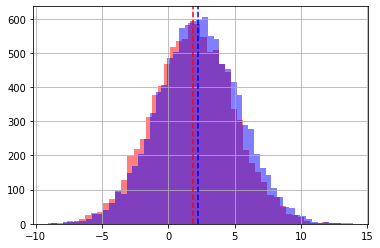

In [ ]:
histogramm(x1_0, y1_1)

In [ ]:
# или с помощью qq графика
def qq(a,b):
  plt.figure(figsize=(12, 7))
  sm.qqplot(a, line='s')
  plt.title("QQ plot 0")
  sm.qqplot(b, line='s')
  plt.title("QQ plot 1")
  pylab.show()

<Figure size 864x504 with 0 Axes>

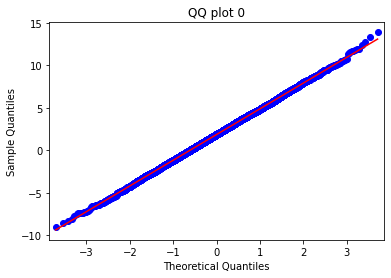

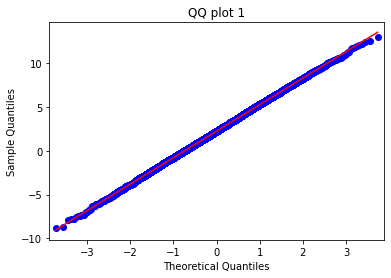

In [ ]:
qq(x1_0,y1_1)

In [ ]:
#с помощью критерия Флигнера-Килина проверим равенство дисперсий
def dispers(a, b):
  p = stats.fligner(a,b)
  print('p-value =', p[1])
  alpha = 0.05
  if p[1] > alpha:
      print('Не отклоняем гипотезу о равенстве дисперсий')
  else:
      print('Отклоняем гипотезу о равенстве дисперсий')

In [ ]:
dispers(x1_0,y1_1)

p-value = 0.8780501201261598
Не отклоняем гипотезу о равенстве дисперсий


In [ ]:
#распределение нормальное, а также различия в дисперсиях выборок статистически незначимы
#применяем t-критерий (для двух независимых выборок) для проверки гипотезы о равенстве средних

#напишем t-test сейчас сами, но далее будем пользоваться библиотечной функцией
n1 = len(x1_0)
n2 = len(y1_1)
n = len(x1_0) + len(y1_1)
alpha = 0.05
s1 = np.sqrt(np.sum(np.power(x1_0-x1_0.mean(), 2))/(n1-1))
s2 = np.sqrt(np.sum(np.power(y1_1-y1_1.mean(), 2))/(n2-1))
# Расчет t статистики
t_stat = (x1_0.mean()-y1_1.mean())/np.sqrt(s1**2/n1 + s2**2/n2)
p = stats.t.sf(np.abs(t_stat), n-1)*2
print('t_stat =', t_stat, 'p-value =', '{:.12f}'.format(p))
cv = stats.t.ppf((1.0 - alpha), len(y1_1)+len(x1_0)) #критическое значение
if abs(t_stat) <= cv:
    print('Интерпретация t_stat: Не отклоняем гипотезу о равенстве средних.') 
else: 
    print('Интерпретация t_stat: Отклоняем гипотезу о равенстве средних.')
if p > alpha:
    print('Интерпретация p-value: Не отклоняем гипотезу о равенстве средних')
else:
    print('Интерпретация p-value: Отклоняем гипотезу о равенстве средних')

t_stat = -9.332608430209355 p-value = 0.000000000000
Интерпретация t_stat: Отклоняем гипотезу о равенстве средних.
Интерпретация p-value: Отклоняем гипотезу о равенстве средних


In [ ]:
#библиотечная
def mean(a, b, alpha = 0.05):
  n = (len(a) + len(b)) - 2 #степень свободы
  cv = stats.t.ppf((1.0 - alpha), n) #критическое значение
  t_stat, p = stats.ttest_ind(a,b)
  print('t_stat =', t_stat, 'p-value =', p)
  if abs(t_stat) <= cv:
      print('Интерпретация t_stat: Не отклоняем гипотезу о равенстве средних.') 
  else: 
      print('Интерпретация t_stat: Отклоняем гипотезу о равенстве средних.')
  if p > alpha:
      print('Интерпретация p-value: Не отклоняем гипотезу о равенстве средних')
  else:
      print('Интерпретация p-value: Отклоняем гипотезу о равенстве средних')

In [ ]:
mean(x1_0,y1_1)

t_stat = -9.332400850259313 p-value = 1.1400916649505329e-20
Интерпретация t_stat: Отклоняем гипотезу о равенстве средних.
Интерпретация p-value: Отклоняем гипотезу о равенстве средних


In [ ]:
#estimated_effect (разница средних значений) с предположением о том, что эксперимент рандомизированный
est_ef = y1_1.mean() - x1_0.mean()
#возьмем 90% доверительный интервал вокруг estimated_effect
err = 1.96 * np.sqrt(y1_1.var() / y1_1.shape[0] + x1_0.var() / x1_0.shape[0])
print('estimated effect =', est_ef, 'standart error =', err)

estimated effect = 0.4001031055444413 standart error = 0.08402817848102015


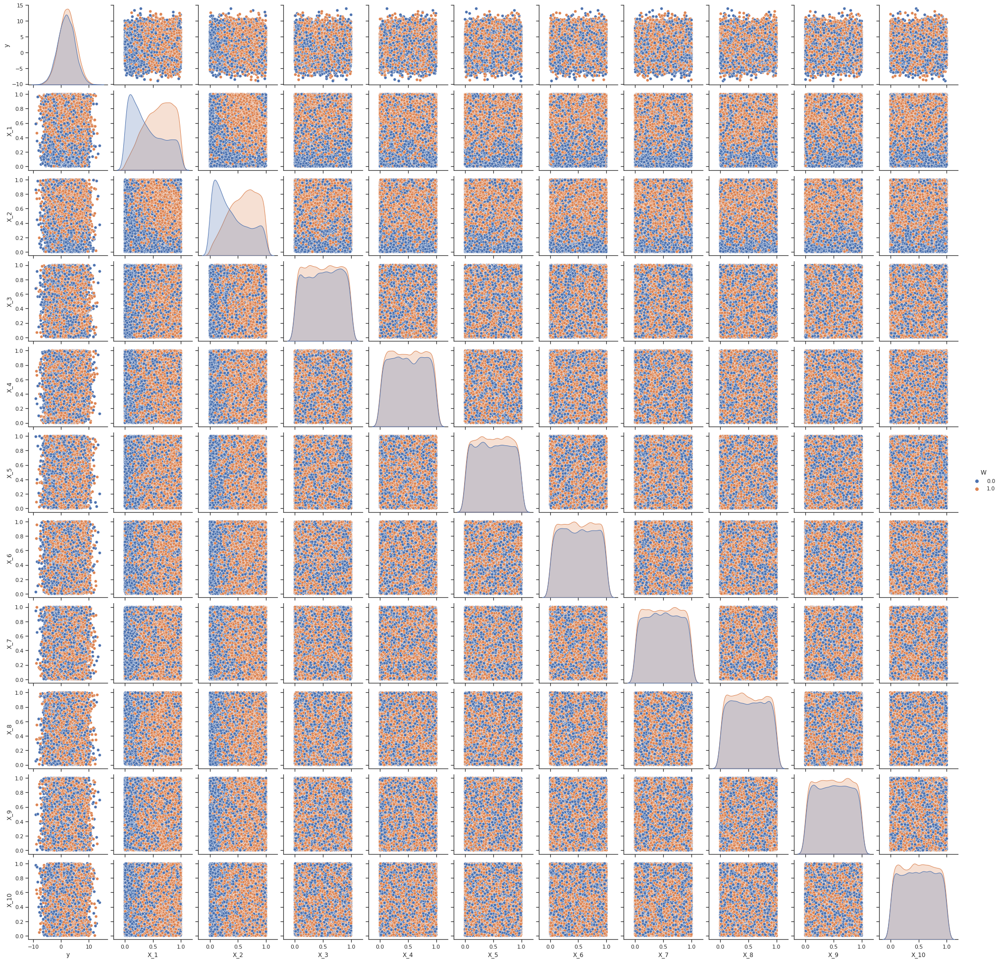

In [ ]:
import seaborn as sns
sns.set_theme(style="ticks")
sns.pairplot(df1, hue = 'W')

In [ ]:
#как видно из вышеприведенных графиков, W не является независимой от признаков (в частности, если взглянуть на Х_1 и Х_2)
#т.е. предположение о рандомизированном эксперименте неверное
#используем более слабое предположение Unconfoudedness и Overlap

In [ ]:
#АТЕ с помощью линейной регрессии
x = df1.iloc[:,1:]
y =  df1["y"]
x_ = sm.add_constant(x)
smm = sm.OLS(y, x_)
res = smm.fit()
print('\n', 'ATE =', res.params[1],'\n','t-stat = ', res.tvalues[1],'\n','p-value = ', res.pvalues[1])
print('\n', res.summary())


 ATE = 0.5133854882565606 
 t-stat =  10.466634914152257 
 p-value =  1.4315715543031236e-25

                             OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.016
Model:                            OLS   Adj. R-squared:                  0.015
Method:                 Least Squares   F-statistic:                     28.94
Date:                Thu, 10 Dec 2020   Prob (F-statistic):           3.99e-61
Time:                        08:08:54   Log-Likelihood:                -50425.
No. Observations:               20000   AIC:                         1.009e+05
Df Residuals:                   19988   BIC:                         1.010e+05
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------

In [ ]:
#можем сделать вывод, что воздействие действенное
#эксперимент полностью не рандомизированный, предположение о полной независимости treatment от объектов неверное
#приняли предположение Unconfoudedness и overlap
#проведена оценка АТЕ: -estimated_effect-, -линейная регрессия-
#результат оценки ATE, полученный в первом случае -estimated_effect- (при предположении о полной независимости treatment от объектов неверное) ниже, чем во втором (с помощью регрессии)

### 2. Оценка результатов AB теста с показателями до начала эксперимента

Необходимо как и ранее оценить результаты AB теста, а именно ATE. Вы располагаете результатами до и после проведения теста (y_0 и y_1), а также вам дан treatment assignment (W). 

Необходимо: 
1. Проверить все требуемые гипотезы
2. Оценить ATE подходящим для этого случая методом (примените несколько методов)
3. Сравнить и проанализировать результаты оценок
4. Явно выписать выводы.

Как и прежде, все предположения должны быть указаны. Визуализация результатов приветствуется.

dataset_part2_students.csv

In [ ]:
df2 = pd.read_csv("/content/gdrive/MyDrive/dataset_part2_students.csv", sep = '\t')

In [ ]:
df2.head()

,y_1,y_0,W,X_1,X_2,X_3,X_4,X_5,X_6,X_7,X_8,X_9,X_10
0,5.887156,2.785060,1.0,0.605978,0.733369,0.138947,0.312673,0.997243,0.128162,0.178993,0.752925,0.662161,0.784310
1,2.232601,5.533515,0.0,0.096894,0.058571,0.962396,0.616557,0.086630,0.561272,0.616525,0.963843,0.574304,0.371161
2,0.144419,0.095546,1.0,0.452145,0.201850,0.569305,0.195096,0.583704,0.476313,0.517814,0.823099,0.732225,0.069056
3,-2.446425,3.590472,1.0,0.672129,0.643485,0.828014,0.204469,0.617489,0.617701,0.301069,0.871741,0.589654,0.981770
4,2.163090,1.365405,0.0,0.442232,0.126318,0.508831,0.431786,0.915940,0.709016,0.890655,0.588886,0.636830,0.342209


In [ ]:
x2_0 = df2[df2['W']==0]
y2_1 = df2[df2['W']==1]

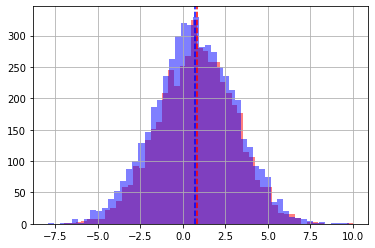

In [ ]:
#проверим на нормальность распределений таргета
histogramm(x2_0['y_0'], y2_1['y_0']) #до воздействия

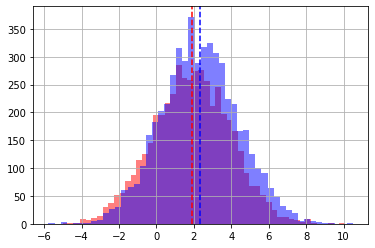

In [ ]:
histogramm(x2_0['y_1'], y2_1['y_1']) #после воздействия

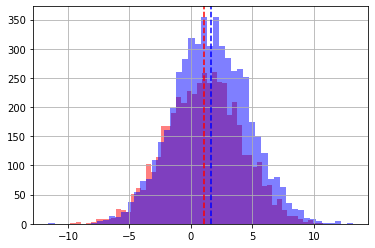

In [ ]:
histogramm(x2_0['y_1'] - x2_0['y_0'], y2_1['y_1'] - y2_1['y_0']) #гистограмма изменения таргета после воздействия

In [ ]:
#исходя из формы гистограммы, можем сделать вывод, что существенных отклонений от нормальности нет

In [ ]:
#с помощью критерия Флигнера-Килина проверим равенство дисперсий изменений таргета после воздействия
dispers(x2_0['y_1'] - x2_0['y_0'], y2_1['y_1'] - y2_1['y_0'])

p-value = 0.9842194800359902
Не отклоняем гипотезу о равенстве дисперсий


In [ ]:
dispers(x2_0['y_0'] , y2_1['y_0']) #до воздействия

p-value = 0.0011111631081886838
Отклоняем гипотезу о равенстве дисперсий


In [ ]:
dispers(x2_0['y_1'] , y2_1['y_1']) #после воздействия

p-value = 0.5410388620992492
Не отклоняем гипотезу о равенстве дисперсий


In [ ]:
#применяем t-критерий (для двух зависимых выборок, т.е. до и после воздействия) для проверки гипотезы о равенстве средних
def mean_dependent(a, b, alpha = 0.05):
  n = (len(a)) - 1   #степень свободны       
  cv = stats.t.ppf((1.0 - alpha), n) #критическое значение
  t_stat, p = stats.ttest_rel(a,b)
  print('t_stat =', t_stat, 'p-value =', p)
  if abs(t_stat) <= cv:
      print('Интерпретация t_stat: Не отклоняем гипотезу о равенстве средних.') 
  else: 
      print('Интерпретация t_stat: Отклоняем гипотезу о равенстве средних.')
  if p > alpha:
      print('Интерпретация p-value: Не отклоняем гипотезу о равенстве средних')
  else:
      print('Интерпретация p-value: Отклоняем гипотезу о равенстве средних')

In [ ]:
#проверим наличие воздействия на изменение таргета
#поскольку сравниваем состояние таргета до и после воздействия, то это зависимые(парные) выборки
mean_dependent(y2_1['y_1'], y2_1['y_0'])

t_stat = 38.44253146154512 p-value = 4.8441785663390546e-285
Интерпретация t_stat: Отклоняем гипотезу о равенстве средних.
Интерпретация p-value: Отклоняем гипотезу о равенстве средних


In [ ]:
mean_dependent(y2_1['y_1'] - y2_1['y_0'], y2_1['y_0']) #также стоит заменить, что распределение величины влияния воздействия не совпадает с распределением таргета "до"

t_stat = 13.299209007648166 p-value = 1.0241159431551611e-39
Интерпретация t_stat: Отклоняем гипотезу о равенстве средних.
Интерпретация p-value: Отклоняем гипотезу о равенстве средних


In [ ]:
#на основании можем сделать вывод, что воздействие оказывает существенное влияние на изменение таргета

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  


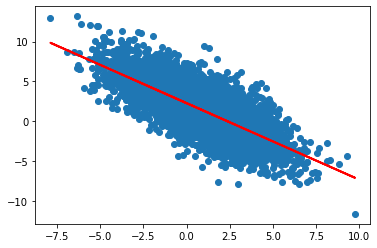

In [ ]:
#визуализируем влияние воздействия на изменение таргета
#можем заметить, что чем больше таргет "до", тем меньше влияние воздействия
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(df2[df2['W']==1]['y_0'][:, np.newaxis], df2[df2['W']==1]['y_1']-df2[df2['W']==1]['y_0'])
plt.scatter(x = df2[df2['W']==1]['y_0'], y = df2[df2['W']==1]['y_1']-df2[df2['W']==1]['y_0']);
#построим "тенденцию"
plt.plot(df2[df2['W']==1]['y_0'][:, np.newaxis], lr.predict(df2[df2['W']==1]['y_0'][:, np.newaxis]), color='red', linewidth=2)

In [ ]:
#проверим гипотезу о том, что первоначальное "состояние" (таргет) у двух групп control и treatment одинаковое
#на этот раз выборки несвязанные
mean(x2_0['y_0'], y2_1['y_0'])

t_stat = 2.6947405425339337 p-value = 0.007056118548053932
Интерпретация t_stat: Отклоняем гипотезу о равенстве средних.
Интерпретация p-value: Отклоняем гипотезу о равенстве средних


In [ ]:
#можем сделать вывод о том, что состояние у двух групп на момент начала эксперимента разное, то есть распределение treatment не является абсолютно случайным

In [ ]:
#estimated_effect (разница средних значений) с предположением о том, что эксперимент рандомизированный
est_ef = (y2_1['y_1'] - y2_1['y_0']).mean() - (x2_0['y_1'] - x2_0['y_0']).mean()
#возьмем 90% доверительный интервал вокруг estimated_effect
err = 1.96 * np.sqrt((y2_1['y_1'] - y2_1['y_0']).var() / (y2_1['y_1'] - y2_1['y_0']).shape[0] + (x2_0['y_1'] - x2_0['y_1']).var() / (x2_0['y_1'] - x2_0['y_1']).shape[0])
print('\n', 'estimated effect =', est_ef, '\n', 'standart error =', err)


 estimated effect = 0.5549047702971162 
 standart error = 0.0824562839763681


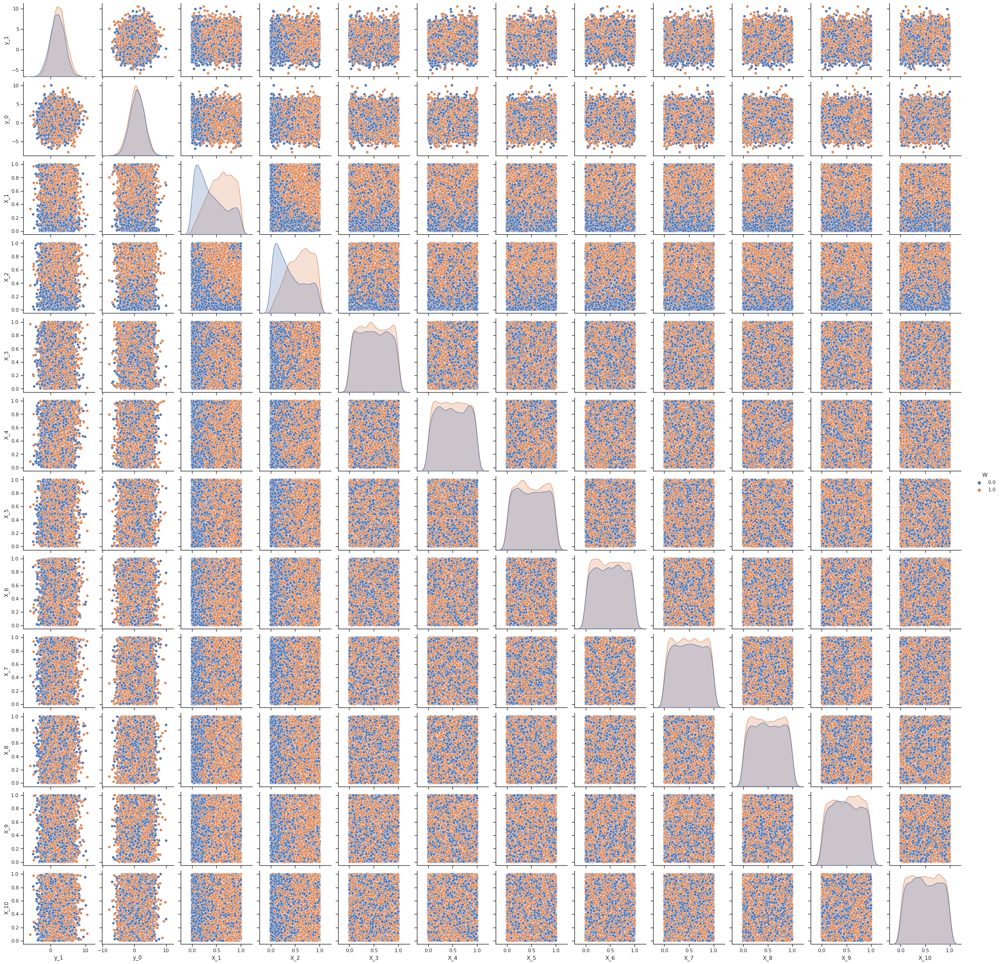

In [ ]:
sns.set_theme(style="ticks")
sns.pairplot(df2, hue = 'W')

In [ ]:
#как видно из вышеприведенных графиков, W не является независимой от признаков (в частности, если взглянуть на Х_1 и Х_2)
#т.е. предположение о рандомизированном эксперименте неверное
#используем более слабое предположение Unconfoudedness и Overlap

In [ ]:
#для оценки АТЕ применим линейную регрессию, которая учитывает распределение признаков
x = df2.iloc[:,2:]
y =  df2["y_1"] - df2["y_0"]
x_ = sm.add_constant(x)
smm = sm.OLS(y, x_)
res = smm.fit()
print('\n', 'ATE =', res.params[1],'\n','t-stat = ', res.tvalues[1],'\n','p-value = ', res.pvalues[1])
print('\n', res.summary())


 ATE = 0.542507153183226 
 t-stat =  7.761301581732602 
 p-value =  9.229602886914728e-15

                             OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.010
Model:                            OLS   Adj. R-squared:                  0.009
Method:                 Least Squares   F-statistic:                     8.879
Date:                Thu, 10 Dec 2020   Prob (F-statistic):           6.27e-16
Time:                        08:09:48   Log-Likelihood:                -25298.
No. Observations:               10000   AIC:                         5.062e+04
Df Residuals:                    9988   BIC:                         5.071e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------

In [ ]:
#оценка АТЕ с помощью DID
data_t0 = df2[["y_0", "W"]].rename(columns={'y_0': 'y'})
data_t0.insert(1, 'Ind_t', 0)
data_t1 = df2[["y_1", "W"]].rename(columns={'y_1': 'y'})
data_t1.insert(1, 'Ind_t', 1)
df2_concat = pd.concat([data_t0, data_t1])
smm = sm.OLS.from_formula("y ~ Ind_t + W + Ind_t*W", data=df2_concat)
res = smm.fit()
print('\n', 'ATE =', res.params[3],'\n','t-stat = ', res.tvalues[3],'\n','p-value = ', res.pvalues[3])
print('\n', res.summary())


 ATE = 0.5549047702971174 
 t-stat =  8.985370978103116 
 p-value =  2.8025771286828997e-19

                             OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.092
Model:                            OLS   Adj. R-squared:                  0.092
Method:                 Least Squares   F-statistic:                     676.8
Date:                Thu, 10 Dec 2020   Prob (F-statistic):               0.00
Time:                        08:10:00   Log-Likelihood:                -43972.
No. Observations:               20000   AIC:                         8.795e+04
Df Residuals:                   19996   BIC:                         8.798e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------

In [ ]:
#корректировка с помощью CUPED
teta_0 = np.cov(x2_0["y_1"], x2_0["y_0"])[0][1] / np.var(x2_0["y_0"])
teta_1 = np.cov(y2_1["y_1"], y2_1["y_0"])[0][1] / np.var(y2_1["y_0"])
t_CUPED_0 = x2_0["y_1"] - (x2_0["y_0"] - np.mean(x2_0["y_0"])) * teta_0
t_CUPED_1 = y2_1["y_1"] - (y2_1["y_0"] - np.mean(y2_1["y_0"])) * teta_1
teta = np.cov(df2["y_1"], df2["y_0"])[0][1] / np.var(df2["y_0"])
t_CUPED = df2["y_1"] - (df2["y_0"] - np.mean(df2["y_0"])) * teta

In [ ]:
data_t0_CUPED = df2.copy()[["y_0", "W"]].rename(columns={'y_0': 'y'})
data_t0_CUPED.insert(1, 'Ind_t', 0)
data_t1_CUPED = df2.copy()[["y_1", "W"]].rename(columns={'y_1': 'y'})
data_t1_CUPED['y'] = t_CUPED
data_t1_CUPED.insert(1, 'Ind_t', 1)
df2_CUPED = pd.concat([data_t0_CUPED, data_t1_CUPED])
smm = sm.OLS.from_formula("y ~ Ind_t + W + Ind_t*W", data=df2_CUPED)
res = smm.fit()
print('\n', 'ATE =', res.params[3],'\n','t-stat = ', res.tvalues[3],'\n','p-value = ', res.pvalues[3])
print('\n', res.summary())


 ATE = 0.557824504926151 
 t-stat =  9.03433985173373 
 p-value =  1.7964887946532685e-19

                             OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.092
Model:                            OLS   Adj. R-squared:                  0.092
Method:                 Least Squares   F-statistic:                     677.5
Date:                Thu, 10 Dec 2020   Prob (F-statistic):               0.00
Time:                        08:10:06   Log-Likelihood:                -43968.
No. Observations:               20000   AIC:                         8.794e+04
Df Residuals:                   19996   BIC:                         8.798e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------

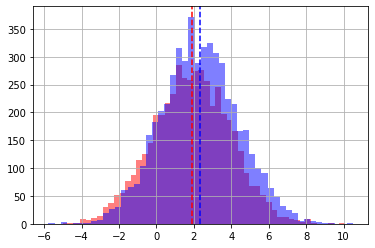

In [ ]:
#проверим распределение таргета до CUPED по группам
histogramm(x2_0['y_1'], y2_1['y_1']) 

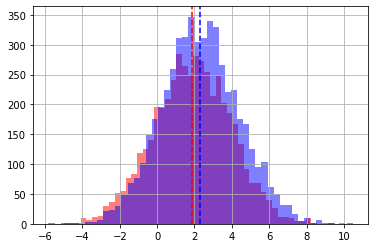

In [ ]:
#проверим распределение таргета после CUPED по группам
histogramm(x2_0["y_1"] - (x2_0["y_0"] - np.mean(x2_0["y_0"])) * teta_0, y2_1["y_1"] - (y2_1["y_0"] - np.mean(y2_1["y_0"])) * teta_1) 

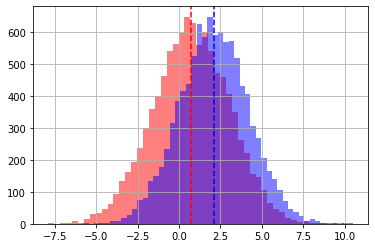

In [ ]:
histogramm(df2["y_0"], df2["y_1"]) #без CUPED

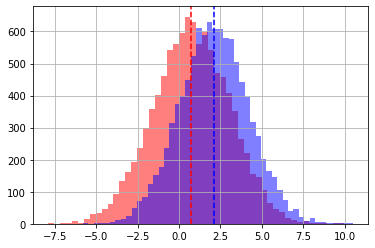

In [ ]:
histogramm(df2["y_0"], df2["y_1"] - (df2["y_0"] - np.mean(df2["y_0"])) * teta) #с CUPED

In [ ]:
#вычислим дисперсию и среднее
print('var_0 =', np.var(x2_0["y_1"]), '\t','\t', 'mean_0 =', np.mean(x2_0["y_1"]))
print('var_CUPED_0 =',np.var(x2_0["y_1"] - (x2_0["y_0"] - np.mean(x2_0["y_0"])) * teta_0), '\t', 'mean_CUPED_0 =',np.mean(x2_0["y_1"] - (x2_0["y_0"] - np.mean(x2_0["y_0"])) * teta_0))
print('\n')
print('var_1 =', np.var(y2_1["y_1"]), '\t','\t', 'mean_1 =', np.mean(y2_1["y_1"]))
print('var_CUPED_1 =',np.var(y2_1["y_1"] - (y2_1["y_0"] - np.mean(y2_1["y_0"])) * teta_1), '\t', 'mean_CUPED_1 =',np.mean(y2_1["y_1"] - (y2_1["y_0"] - np.mean(y2_1["y_0"])) * teta_1))
print('\n')
print('var =', np.var(df2["y_1"]), '\t','\t', 'mean =', np.mean(df2["y_1"]))
print('var_CUPED =',np.var(df2["y_1"] - (df2["y_0"] - np.mean(df2["y_0"])) * teta), '\t','\t', 'mean_CUPED =',np.mean(df2["y_1"] - (df2["y_0"] - np.mean(df2["y_0"])) * teta))

var_0 = 4.291529245071075 	 	 mean_0 = 1.8785415842850846
var_CUPED_0 = 4.291329732644548 	 mean_CUPED_0 = 1.878541584285081


var_1 = 4.231268066371593 	 	 mean_1 = 2.30979318121018
var_CUPED_1 = 4.221365672263376 	 mean_CUPED_1 = 2.30979318121018


var = 4.306339749101811 	 	 mean = 2.1045174210738353
var_CUPED = 4.303410659410889 	 	 mean_CUPED = 2.104517421073833


In [ ]:
#можем заметить, что CUPED сохраняет среднее значение, вообще, он способен повысить статистическую мощность теста без увеличения размера выборки,
#способен уменьшить дисперсию, увеличить чувствительность теста, а следовательно, и время принятия решений. 
#в нашем же случае влияние на дисперсию незначительное, поскольку данные имеют нормально распределение и дисперсия невелика, увеличение АТЕ незначительное
#изначально тест и так был чувствительным

In [ ]:
#использование метода ANCOVA
smm = sm.OLS.from_formula("y_1 ~ y_0 + W ", df2)
res = smm.fit()
print('\n', 'ATE =', res.params[2],'\n','t-stat = ', res.tvalues[2],'\n','p-value = ', res.pvalues[2])
print('\n', res.summary())


 ATE = 0.43448638144566565 
 t-stat =  10.512435690377608 
 p-value =  1.0308914389535954e-25

                             OLS Regression Results                            
Dep. Variable:                    y_1   R-squared:                       0.012
Model:                            OLS   Adj. R-squared:                  0.011
Method:                 Least Squares   F-statistic:                     58.70
Date:                Thu, 10 Dec 2020   Prob (F-statistic):           4.54e-26
Time:                        08:10:44   Log-Likelihood:                -21431.
No. Observations:               10000   AIC:                         4.287e+04
Df Residuals:                    9997   BIC:                         4.289e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------

In [ ]:
#попробуем добавить признаки, но в первую очередь те, распределение которых зависит от группы - это Х_1 и Х_2
smm = sm.OLS.from_formula("y_1 ~ y_0 + W + X_1 + X_2", df2)
res = smm.fit()
print('\n', 'ATE =', res.params[2],'\n','t-stat = ', res.tvalues[2],'\n','p-value = ', res.pvalues[2])
print('\n', res.summary())


 ATE = 0.5462690769424197 
 t-stat =  11.524524194009025 
 p-value =  1.5472562713952018e-30

                             OLS Regression Results                            
Dep. Variable:                    y_1   R-squared:                       0.014
Model:                            OLS   Adj. R-squared:                  0.013
Method:                 Least Squares   F-statistic:                     35.19
Date:                Thu, 10 Dec 2020   Prob (F-statistic):           3.12e-29
Time:                        08:10:51   Log-Likelihood:                -21420.
No. Observations:               10000   AIC:                         4.285e+04
Df Residuals:                    9995   BIC:                         4.289e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------

In [ ]:
#попробуем добавить оставшиеся признаки
smm = sm.OLS.from_formula("y_1 ~ y_0 + W + X_1 + X_2 + X_3 + X_4 + X_5 + X_6 + X_7 + X_8 + X_9 + X_10", df2)
res = smm.fit()
print('\n', 'ATE =', res.params[2],'\n','t-stat = ', res.tvalues[2],'\n','p-value = ', res.pvalues[2])
print('\n', res.summary())


 ATE = 0.5481790243712201 
 t-stat =  11.72322012788198 
 p-value =  1.5589534355716816e-31

                             OLS Regression Results                            
Dep. Variable:                    y_1   R-squared:                       0.042
Model:                            OLS   Adj. R-squared:                  0.041
Method:                 Least Squares   F-statistic:                     36.19
Date:                Thu, 10 Dec 2020   Prob (F-statistic):           1.63e-83
Time:                        08:11:04   Log-Likelihood:                -21277.
No. Observations:               10000   AIC:                         4.258e+04
Df Residuals:                    9987   BIC:                         4.267e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------

In [ ]:
#то есть можем заметить, что существенного влияния на ATE добавление оставшихся признаков не оказывает

In [ ]:
#можем сделать вывод, что воздействие действенное
#эксперимент полностью не рандомизированный, предположение о полной независимости treatment от объектов неверное
#приняли предположение Unconfoudedness и overlap
#проведена оценка АТЕ: -estimated_effect-, -линейная регрессия-, -Difference in differences(DiD)-, -ANCOVA-, -CUPED-
#результат оценки ATE, полученный с помощью ANCOVA, оказался ниже остальных, скорее всего, потому что он не учитывает параметры объекта
#в нашем случае CUPED дал незначительное увеличение АТЕ

### 3. Построение uplift модели по результатам AB теста.

Вам даны результаты AB теста для модели конверсии клиента в продукте (conversion). Конверсия может принимать значения 1 или 0, что значит - клиент подключил услугу, либо не подключил соответственно.

Задача:
1. Оцените ATE по данным.
2. Оцените CATE для каждого наблюдения.
3. Проставьте рекомендации к воздействию на каждый объект.
4. Какая ожидаемая конверсия при оптимальном воздействии?
5. Все выводы, предпосылки и методы представляйте в явном виде в ноутбуке.

Визуализация результатов также будет приветствоваться.

dataset_part3_students.csv

In [ ]:
df3 = pd.read_csv("/content/gdrive/MyDrive/dataset_part3_students.csv", sep = '\t')

In [ ]:
df3_F = pd.read_csv("/content/gdrive/MyDrive/dataset_part3_students.csv", sep = '\t')

In [ ]:
df3['treatment'] = df3['treatment'].map({'control': 0, 'treatment': 1})

In [ ]:
df3.head()

,treatment,X_1,X_2,X_3,X_4,X_5,X_6,X_7,X_8,X_9,X_10,X_11,X_12,X_13,X_14,X_15,X_16,X_17,X_18,X_19,X_20,X_21,X_22,conversion
0,0,0.034351,0.550725,-1.348524,-0.029591,0.499535,-0.412464,0.933588,-0.522954,-0.029591,-0.807218,1.318646,-0.065262,-0.956947,-0.314573,-0.879456,0.640264,1.165722,0.570495,0.529443,0.227962,1.929914,0.798664,0
1,0,-1.059404,0.299404,0.220273,-1.569660,1.084204,-2.167118,1.216469,-0.744547,-1.569660,-0.460971,-1.396720,0.600044,1.000000,0.303664,1.080643,2.646483,-0.329690,1.725636,1.434649,-2.064893,0.188000,-1.134651,0
2,0,0.051934,2.338729,-0.341017,-1.099362,0.693090,-2.424267,1.572066,-0.212798,-1.099362,-1.430502,0.469694,1.251940,0.943003,-0.083721,-1.981712,0.224777,2.038004,2.516398,2.324280,-3.182196,-0.888490,-1.402561,0
3,1,0.667770,0.539316,0.468719,-0.840885,-0.708331,0.126634,1.275854,-0.954919,-0.840885,0.408691,-0.422736,-1.593407,0.247038,-0.752011,-0.347319,-1.659402,-0.871980,-0.893513,-0.658078,-2.704997,-0.390745,-1.578004,1
4,0,-1.416158,2.486628,0.496402,-1.174618,2.738267,-4.756755,-0.180918,-1.281432,-1.174618,-0.243256,0.598662,0.750706,0.554053,-1.198151,-0.232961,0.948875,1.210523,1.536723,1.548610,-0.926435,0.972459,-0.711251,0


In [ ]:
x3_0 = df3[df3['treatment']==0]['conversion']
y3_1 = df3[df3['treatment']==1]['conversion']

In [ ]:
#выборки по величине одинаковые
df3['treatment'].value_counts()

1    100000
0    100000
Name: treatment, dtype: int64

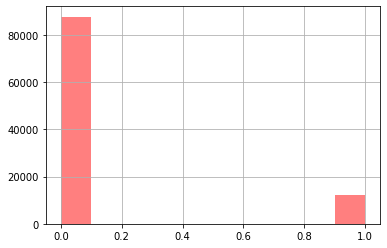

In [ ]:
#посмотрим на частоту появления того или иного таргета в группах
x3_0.hist(alpha = 0.5, color = 'red')

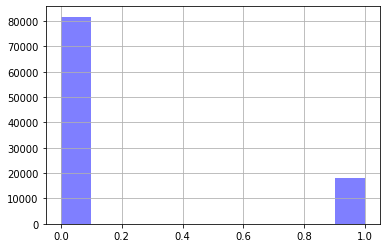

In [ ]:
y3_1.hist(alpha = 0.5, color = 'blue')

In [ ]:
#общий коэффициент конверсии
conv = df3['conversion'].mean()
conv

0.152935

In [ ]:
#посмотрим ко коэф конверсии по группам
results_df = df3.groupby('treatment').agg({'conversion':['mean', 'sum', 'count']})
results_df

conversion               
                mean    sum   count
treatment                          
0            0.12340  12340  100000
1            0.18247  18247  100000

In [ ]:
#разница в коэф конверсий - АТЕ
print('ATE =',(results_df.loc[1,('conversion', 'mean')] - results_df.loc[0,('conversion', 'mean')]).round(4))

ATE = 0.0591


In [ ]:
#тоже самое, что и estimated_effect ранее

#estimated_effect (разница средних значений) с предположением о том, что эксперимент рандомизированный
est_ef = y3_1.mean() - x3_0.mean()
#возьмем 90% доверительный интервал вокруг estimated_effect
err = 1.96 * np.sqrt(y3_1.var() / y3_1.shape[0] + x3_0.var() / x3_0.shape[0])
print('estimated effect =', est_ef, 'standart error =', err)

estimated effect = 0.05907 standart error = 0.0031442561217458077


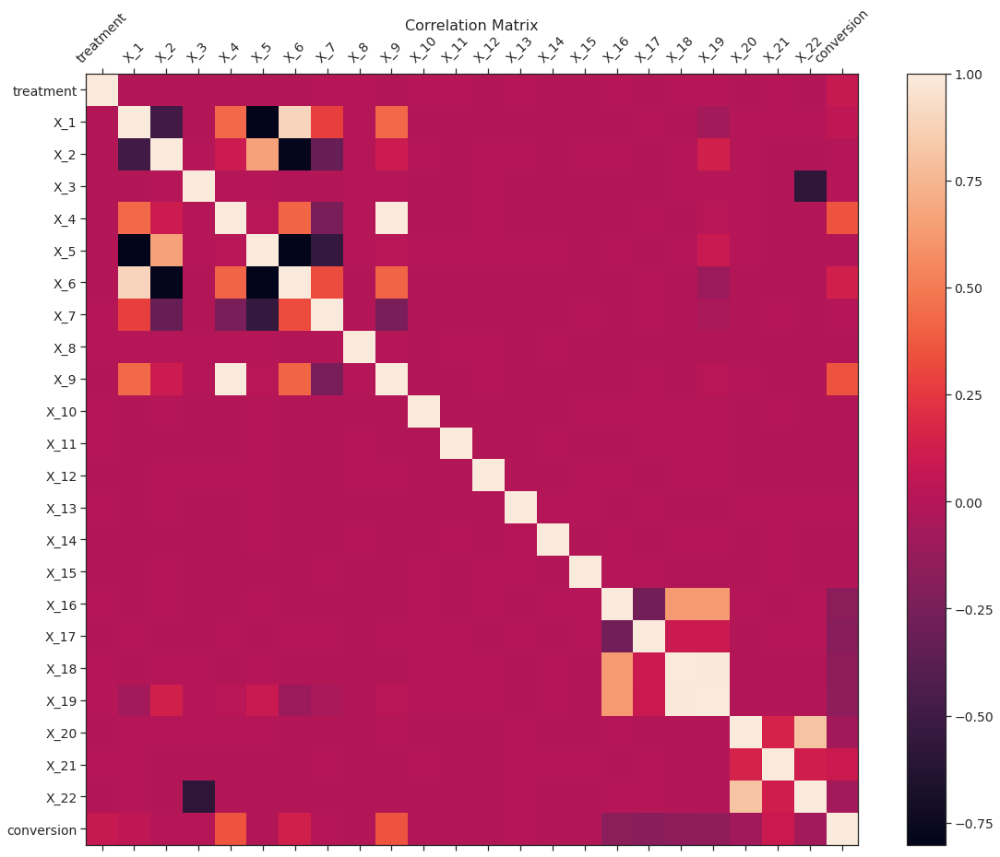

In [ ]:
#можем посмотреть матрицу коррреляций
plt.matshow(df3.corr(), fignum=f.number)
plt.xticks(range(df3.shape[1]), df3.columns, fontsize=14, rotation=45)
plt.yticks(range(df3.shape[1]), df3.columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=16);

In [ ]:
#можем заметить, что различие в АТЕ небольшое, поскольку эксперимент можно принять рандоминизированным, treatment не зависит от признаков объекта

In [ ]:
#теперь для оценки ATE применим линейную регрессию
x = df3.iloc[:,:-1]
y =  df3["conversion"]
x_ = sm.add_constant(x)
smm = sm.OLS(y, x_)
res = smm.fit()
print('\n', 'ATE =', res.params[1],'\n','t-stat = ', res.tvalues[1],'\n','p-value = ', res.pvalues[1])
print('\n', res.summary())


 ATE = 0.0602425239744898 
 t-stat =  45.193937430075465 
 p-value =  0.0

                             OLS Regression Results                            
Dep. Variable:             conversion   R-squared:                       0.314
Model:                            OLS   Adj. R-squared:                  0.314
Method:                 Least Squares   F-statistic:                     4825.
Date:                Thu, 10 Dec 2020   Prob (F-statistic):               0.00
Time:                        08:11:42   Log-Likelihood:                -41679.
No. Observations:              200000   AIC:                         8.340e+04
Df Residuals:                  199980   BIC:                         8.360e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------

In [ ]:
#оценим вероятности "успеха" в каждой из групп
from statsmodels.stats.proportion import proportions_ztest
def prop_z_test(count, nobs, alpha = 0.05):
  zstat, p = proportions_ztest(count=count, nobs=nobs)
  print('z_stat =', zstat, 'p-value =', p)
  if p > alpha:
      print('Интерпретация p-value: Не отклоняем гипотезу о ревенстве доли успеха')
  else:
      print('Интерпретация p-value: Отклоняем гипотезу о равенстве доли успеха')

In [ ]:
prop_z_test(results_df[('conversion', 'sum')], results_df[('conversion', 'count')])

z_stat = -36.697811080147375 p-value = 7.914399069886364e-295
Интерпретация p-value: Отклоняем гипотезу о равенстве доли успеха


In [ ]:
#следовательно, ATE значимый 

In [ ]:
#разобьем нашу выборку
from sklearn.model_selection import train_test_split
X = df3.drop(['conversion'],axis=1)
y = df3.conversion
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=df3['treatment'])

In [ ]:
#для нахождения САТЕ обучим S-Learner с помощью XGBClassifier
import sklearn as sk
from sklearn.metrics import auc
import xgboost as xgb
from xgboost import plot_importance
model_S = xgb.XGBClassifier(learning_rate = 0.1,
                          max_depth = 6,
                          min_child_weight = 100,
                          objective = 'binary:logistic',
                          seed = 42,
                          gamma = 0.1,
                          silent = True,
                          n_jobs=2) 

In [ ]:
model_S.fit(X_train, y_train, eval_metric="auc")

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0.1,
              learning_rate=0.1, max_delta_step=0, max_depth=6,
              min_child_weight=100, missing=None, n_estimators=100, n_jobs=2,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=42,
              silent=True, subsample=1, verbosity=1)

In [ ]:
from sklearn.metrics import roc_auc_score
print('ROC-AUC score test:', roc_auc_score(y_test, model_S.predict(X_test)))


ROC-AUC score test: 0.8915628393785476


In [ ]:
#результат неплохой, predict_probу будем давать на всей выборке, не разделяя на трейн-тест

In [ ]:
X_S0 = X.copy()
X_S0['treatment'] = 0
X_S1 = X.copy() 
X_S1['treatment'] = 1
Uplift_S = model_S.predict_proba(X_S1)[:,1] - model_S.predict_proba(X_S0)[:,1]

Text(0.5, 0, 'Uplift_S score')

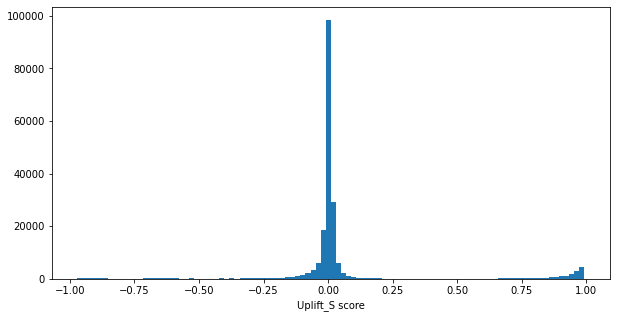

In [ ]:
f = plt.figure(figsize=(10, 5))
plt.hist(Uplift_S, bins=100)
plt.xlabel('Uplift_S score')

In [ ]:
#можем заметить, что есть и отрицательный прирост конверсии, такой эффект дают "Sleeping dogs"

In [ ]:
#добавим СATE
res_S = df3.copy()
res_S['CATE'] = Uplift_S
res_S.head()

,treatment,X_1,X_2,X_3,X_4,X_5,X_6,X_7,X_8,X_9,X_10,X_11,X_12,X_13,X_14,X_15,X_16,X_17,X_18,X_19,X_20,X_21,X_22,conversion,CATE
0,0,0.034351,0.550725,-1.348524,-0.029591,0.499535,-0.412464,0.933588,-0.522954,-0.029591,-0.807218,1.318646,-0.065262,-0.956947,-0.314573,-0.879456,0.640264,1.165722,0.570495,0.529443,0.227962,1.929914,0.798664,0,0.004064
1,0,-1.059404,0.299404,0.220273,-1.569660,1.084204,-2.167118,1.216469,-0.744547,-1.569660,-0.460971,-1.396720,0.600044,1.000000,0.303664,1.080643,2.646483,-0.329690,1.725636,1.434649,-2.064893,0.188000,-1.134651,0,0.005390
2,0,0.051934,2.338729,-0.341017,-1.099362,0.693090,-2.424267,1.572066,-0.212798,-1.099362,-1.430502,0.469694,1.251940,0.943003,-0.083721,-1.981712,0.224777,2.038004,2.516398,2.324280,-3.182196,-0.888490,-1.402561,0,0.004191
3,1,0.667770,0.539316,0.468719,-0.840885,-0.708331,0.126634,1.275854,-0.954919,-0.840885,0.408691,-0.422736,-1.593407,0.247038,-0.752011,-0.347319,-1.659402,-0.871980,-0.893513,-0.658078,-2.704997,-0.390745,-1.578004,1,0.983876
4,0,-1.416158,2.486628,0.496402,-1.174618,2.738267,-4.756755,-0.180918,-1.281432,-1.174618,-0.243256,0.598662,0.750706,0.554053,-1.198151,-0.232961,0.948875,1.210523,1.536723,1.548610,-0.926435,0.972459,-0.711251,0,-0.003542


In [ ]:
res_S['CATE'].describe()

count    200000.000000
mean          0.058686
std           0.287164
min          -0.972058
25%          -0.005930
50%           0.005003
75%           0.013829
max           0.993891
Name: CATE, dtype: float64

<Figure size 1080x720 with 0 Axes>

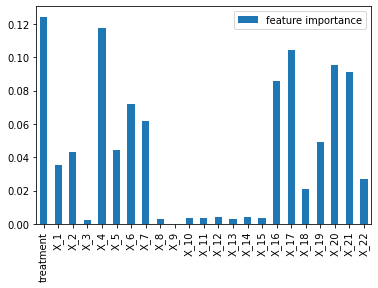

In [ ]:
#с помощью модели можно посмотреть на важность признаков
feat_importances = pd.DataFrame(model_S.feature_importances_, index=X.columns, columns=['feature importance'])
plt.figure(figsize=(15, 10))
feat_importances.plot(kind='bar')

In [ ]:
#для S-Learner
data = df3.copy()
data['Uplift score'] = Uplift_S
sorted_data = data.sort_values('Uplift score', ascending=False).reset_index(drop=True)

sorted_data['1_Test'] = (sorted_data['conversion'] * sorted_data['treatment']).cumsum()
sorted_data['1_Control'] = (sorted_data['conversion'] * (sorted_data['treatment']==0)).cumsum()
sorted_data['0_Test'] = sorted_data['treatment'].cumsum()
sorted_data['0_Control'] = (sorted_data['treatment']==0).cumsum()
sorted_data[['treatment', 'conversion', 'Uplift score', '1_Test', '1_Control', '0_Test', '0_Control']].head(10)

,treatment,conversion,Uplift score,1_Test,1_Control,0_Test,0_Control
0,0,0,0.993891,0,0,0,1
1,1,1,0.993698,1,0,1,1
2,1,1,0.993679,2,0,2,1
3,0,0,0.993466,2,0,2,2
4,1,1,0.993462,3,0,3,2
5,1,1,0.993358,4,0,4,2
6,0,0,0.993354,4,0,4,3
7,0,0,0.993343,4,0,4,4
8,0,0,0.993297,4,0,4,5
9,0,0,0.993274,4,0,4,6


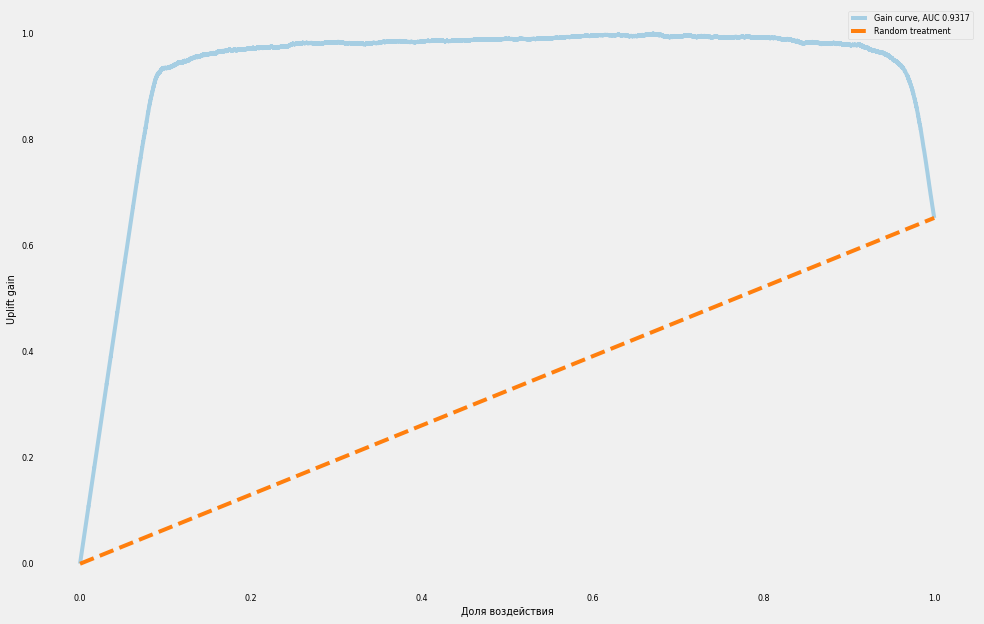

In [ ]:
sorted_data['Gain curve'] = ((sorted_data['1_Test']/sorted_data['0_Test'])-(sorted_data['1_Control']/sorted_data['0_Control'])) * (sorted_data['0_Test'] + sorted_data['0_Control'])

gain_x = sorted_data.index.values + 1
gain_x = gain_x/gain_x.max()
gain_y = (sorted_data['Gain curve']/sorted_data['Gain curve'].max()).values
nan_mask = np.isnan(gain_y)
gain_x = gain_x[~nan_mask]
gain_y = gain_y[~nan_mask]

matplotlib.rcParams['font.size'] = 8
gain_auc = auc(gain_x, gain_y)
plt.figure(figsize=(15, 10))
ax = plt.axes()
ax.plot(gain_x, gain_y, label='Gain curve, AUC {}'.format(gain_auc.round(4)))
ax.plot([0, 1], [0, gain_y[-1]],'--', color='tab:orange',label='Random treatment')
ax.legend()
ax.set_xlabel('Доля воздействия')
ax.set_ylabel('Uplift gain')
ax.grid()

In [ ]:
#теперь для нахождения САТЕ обучим T-Learner с помощью XGBClassifier
X_T0 = X[X.treatment==0]
X_T1 = X[X.treatment==1]
y_T0 = df3[df3.treatment==0].conversion
y_T1 = df3[df3.treatment==1].conversion

In [ ]:
X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(X_T1, y_T1, test_size=0.3, random_state=42, stratify=X_T1['treatment'])
X_train_0, X_test_0, y_train_0, y_test_0 = train_test_split(X_T0, y_T0, test_size=0.3, random_state=42, stratify=X_T0['treatment'])

In [ ]:
model_T1 = xgb.XGBClassifier(learning_rate = 0.1,
                          max_depth = 6,
                          min_child_weight = 100,
                          objective = 'binary:logistic',
                          seed = 42,
                          gamma = 0.1,
                          silent = True,
                          n_jobs=2) 

In [ ]:
model_T0 = xgb.XGBClassifier(learning_rate = 0.1,
                          max_depth = 6,
                          min_child_weight = 100,
                          objective = 'binary:logistic',
                          seed = 42,
                          gamma = 0.1,
                          silent = True,
                          n_jobs=2) 

In [ ]:
model_T1.fit(X_train_1, y_train_1)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0.1,
              learning_rate=0.1, max_delta_step=0, max_depth=6,
              min_child_weight=100, missing=None, n_estimators=100, n_jobs=2,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=42,
              silent=True, subsample=1, verbosity=1)

In [ ]:
model_T0.fit(X_train_0,y_train_0)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0.1,
              learning_rate=0.1, max_delta_step=0, max_depth=6,
              min_child_weight=100, missing=None, n_estimators=100, n_jobs=2,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=42,
              silent=True, subsample=1, verbosity=1)

In [ ]:
print('ROC-AUC score test 0:', roc_auc_score(y_test_0, model_T0.predict(X_test_0)))
print('ROC-AUC score test 1:', roc_auc_score(y_test_1, model_T1.predict(X_test_1)))

ROC-AUC score test 0: 0.8736283566161496
ROC-AUC score test 1: 0.9055526744642833


In [ ]:
Uplift_T = model_T1.predict_proba(X)[:,1] - model_T0.predict_proba(X)[:,1]

Text(0.5, 0, 'Uplift_T score')

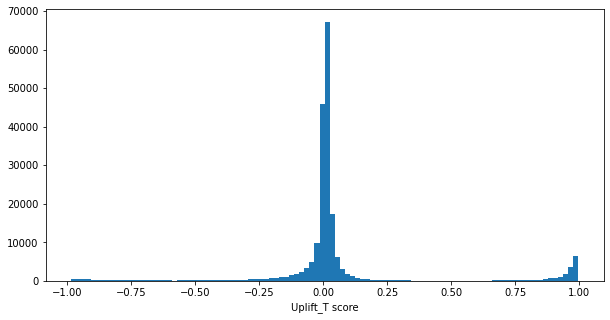

In [ ]:
f = plt.figure(figsize=(10, 5))
plt.hist(Uplift_T, bins=100)
plt.xlabel('Uplift_T score')

In [ ]:
res_T = df3.copy()
res_T['CATE'] = Uplift_T
res_T.head()

,treatment,X_1,X_2,X_3,X_4,X_5,X_6,X_7,X_8,X_9,X_10,X_11,X_12,X_13,X_14,X_15,X_16,X_17,X_18,X_19,X_20,X_21,X_22,conversion,CATE
0,0,0.034351,0.550725,-1.348524,-0.029591,0.499535,-0.412464,0.933588,-0.522954,-0.029591,-0.807218,1.318646,-0.065262,-0.956947,-0.314573,-0.879456,0.640264,1.165722,0.570495,0.529443,0.227962,1.929914,0.798664,0,0.017766
1,0,-1.059404,0.299404,0.220273,-1.569660,1.084204,-2.167118,1.216469,-0.744547,-1.569660,-0.460971,-1.396720,0.600044,1.000000,0.303664,1.080643,2.646483,-0.329690,1.725636,1.434649,-2.064893,0.188000,-1.134651,0,0.005996
2,0,0.051934,2.338729,-0.341017,-1.099362,0.693090,-2.424267,1.572066,-0.212798,-1.099362,-1.430502,0.469694,1.251940,0.943003,-0.083721,-1.981712,0.224777,2.038004,2.516398,2.324280,-3.182196,-0.888490,-1.402561,0,0.006718
3,1,0.667770,0.539316,0.468719,-0.840885,-0.708331,0.126634,1.275854,-0.954919,-0.840885,0.408691,-0.422736,-1.593407,0.247038,-0.752011,-0.347319,-1.659402,-0.871980,-0.893513,-0.658078,-2.704997,-0.390745,-1.578004,1,0.988478
4,0,-1.416158,2.486628,0.496402,-1.174618,2.738267,-4.756755,-0.180918,-1.281432,-1.174618,-0.243256,0.598662,0.750706,0.554053,-1.198151,-0.232961,0.948875,1.210523,1.536723,1.548610,-0.926435,0.972459,-0.711251,0,0.007604


In [ ]:
res_T['CATE'].describe()

count    200000.000000
mean          0.058498
std           0.305633
min          -0.984860
25%          -0.005466
50%           0.008789
75%           0.025375
max           0.995331
Name: CATE, dtype: float64

In [ ]:
data = df3.copy()
data['Uplift score'] = Uplift_S

In [ ]:
sorted_data = data.sort_values('Uplift score', ascending=False).reset_index(drop=True)
sorted_data[['treatment', 'conversion', 'Uplift score']].head(10)

,treatment,conversion,Uplift score
0,0,0,0.993891
1,1,1,0.993698
2,1,1,0.993679
3,0,0,0.993466
4,1,1,0.993462
5,1,1,0.993358
6,0,0,0.993354
7,0,0,0.993343
8,0,0,0.993297
9,0,0,0.993274


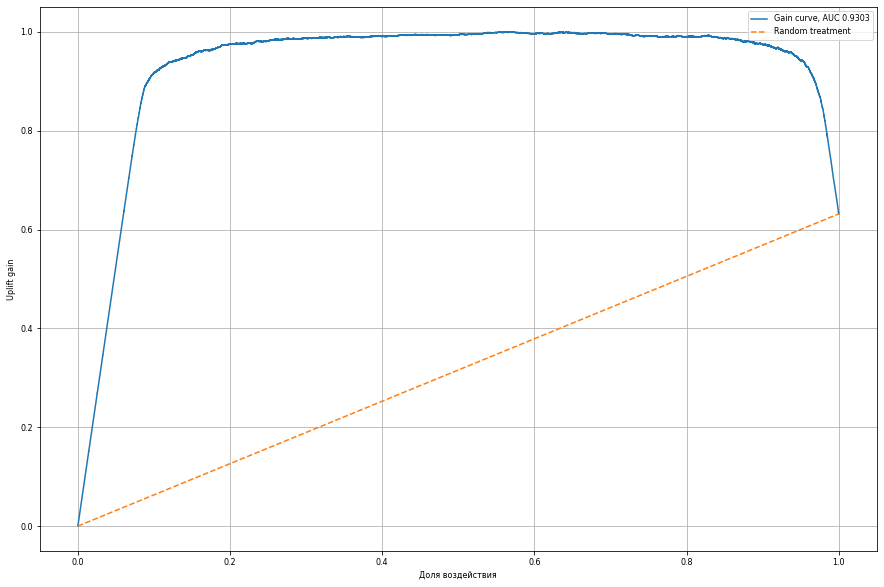

In [ ]:
#для T-Learner
dataT = df3.copy()
dataT['Uplift score'] = Uplift_T
sorted_dataT = dataT.sort_values('Uplift score', ascending=False).reset_index(drop=True)

sorted_dataT['1_Test'] = (sorted_dataT['conversion'] * sorted_dataT['treatment']).cumsum()
sorted_dataT['1_Control'] = (sorted_dataT['conversion'] * (sorted_dataT['treatment']==0)).cumsum()
sorted_dataT['0_Test'] = sorted_dataT['treatment'].cumsum()
sorted_dataT['0_Control'] = (sorted_dataT['treatment']==0).cumsum()
sorted_dataT[['treatment', 'conversion', 'Uplift score', '1_Test', '1_Control', '0_Test', '0_Control']].head(10)

sorted_dataT['Gain curve'] = ((sorted_dataT['1_Test']/sorted_dataT['0_Test'])-(sorted_dataT['1_Control']/sorted_dataT['0_Control'])) * (sorted_dataT['0_Test'] + sorted_dataT['0_Control'])
gain_xT = sorted_dataT.index.values + 1
gain_xT = gain_xT/gain_xT.max()
gain_yT = (sorted_dataT['Gain curve']/sorted_dataT['Gain curve'].max()).values
nan_mask = np.isnan(gain_yT)
gain_xT = gain_xT[~nan_mask]
gain_yT = gain_yT[~nan_mask]

matplotlib.rcParams['font.size'] = 8
gain_auc = auc(gain_xT, gain_yT)
plt.figure(figsize=(15, 10))
ax = plt.axes()
ax.plot(gain_xT, gain_yT, label='Gain curve, AUC {}'.format(gain_auc.round(4)))
ax.plot([0, 1], [0, gain_yT[-1]],'--', color='tab:orange',label='Random treatment')
ax.legend()
ax.set_xlabel('Доля воздействия')
ax.set_ylabel('Uplift gain')
ax.grid()

In [ ]:
!pip install causalml

In [ ]:
a = X.copy().drop(['treatment'], axis = 1).values
b = X['treatment'].values

In [ ]:
#теперь для нахождения САТЕ обучим X-Learner
from causalml.inference.meta import BaseXRegressor
learner_x = BaseXRegressor(learner=xgb.XGBRegressor(n_jobs=-1, max_iter = 10000))
Uplift_X = learner_x.fit(X=a, treatment=b, y=y.values)

In [ ]:
Uplift_X = learner_x.predict(X=a)

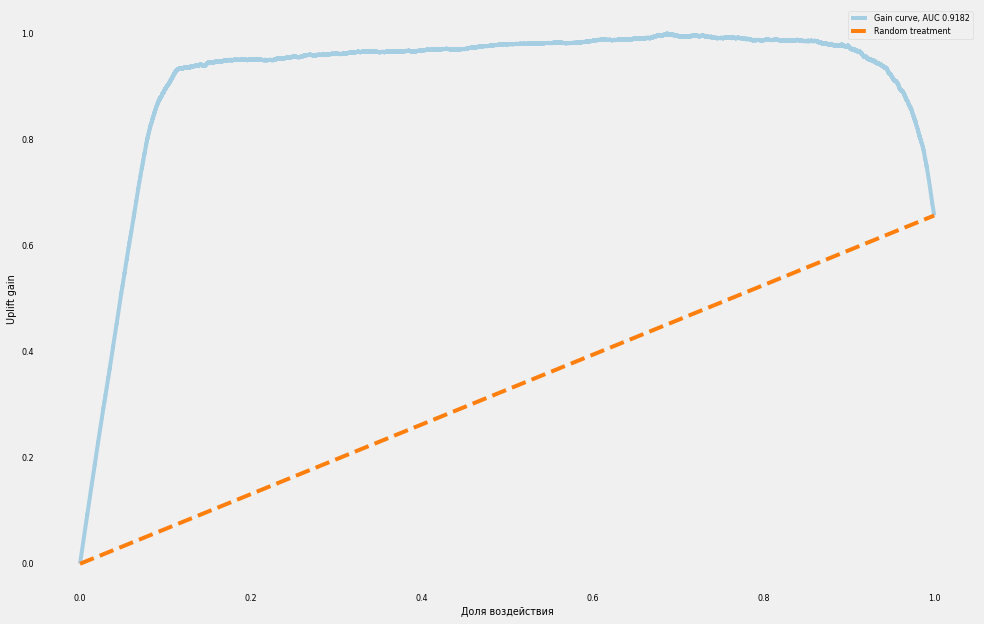

In [ ]:
#для X-Learner
dataX = df3.copy()
dataX['Uplift score'] = Uplift_X
sorted_dataX = dataX.sort_values('Uplift score', ascending=False).reset_index(drop=True)

sorted_dataX['1_Test'] = (sorted_dataX['conversion'] * sorted_dataX['treatment']).cumsum()
sorted_dataX['1_Control'] = (sorted_dataX['conversion'] * (sorted_dataX['treatment']==0)).cumsum()
sorted_dataX['0_Test'] = sorted_dataX['treatment'].cumsum()
sorted_dataX['0_Control'] = (sorted_dataX['treatment']==0).cumsum()
sorted_dataX[['treatment', 'conversion', 'Uplift score', '1_Test', '1_Control', '0_Test', '0_Control']].head(10)

sorted_dataX['Gain curve'] = ((sorted_dataX['1_Test']/sorted_dataX['0_Test'])-(sorted_dataX['1_Control']/sorted_dataX['0_Control'])) * (sorted_dataX['0_Test'] + sorted_dataX['0_Control'])
gain_xX = sorted_dataX.index.values + 1
gain_xX = gain_xX/gain_xX.max()
gain_yX = (sorted_dataX['Gain curve']/sorted_dataX['Gain curve'].max()).values
nan_mask = np.isnan(gain_yX)
gain_xX = gain_xX[~nan_mask]
gain_yX = gain_yX[~nan_mask]

matplotlib.rcParams['font.size'] = 8
gain_auc = auc(gain_xX, gain_yX)
plt.figure(figsize=(15, 10))
ax = plt.axes()
ax.plot(gain_xX, gain_yX, label='Gain curve, AUC {}'.format(gain_auc.round(4)))
ax.plot([0, 1], [0, gain_yX[-1]],'--', color='tab:orange',label='Random treatment')
ax.legend()
ax.set_xlabel('Доля воздействия')
ax.set_ylabel('Uplift gain')
ax.grid()

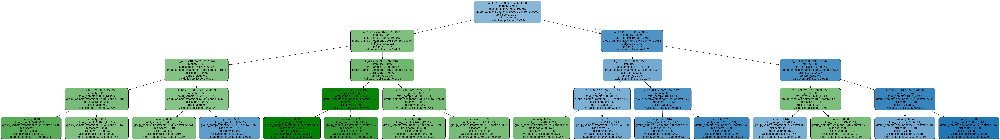

In [ ]:
#теперь для нахождения САТЕ используем лес
from IPython.display import Image
from causalml.inference.tree import UpliftTreeClassifier, UpliftRandomForestClassifier
from causalml.inference.tree import uplift_tree_string, uplift_tree_plot

uplift_model = UpliftRandomForestClassifier(evaluationFunction='KL', control_name = 'control', max_depth=5)
uplift_model.fit(X=df3_F.copy().drop(['treatment', 'conversion'], axis = 1).values, treatment=df3_F['treatment'].values, y=df3_F['conversion'].values)

uplift_tree = uplift_model.uplift_forest[0]
graph = uplift_tree_plot(uplift_tree.fitted_uplift_tree, list(df3_F.copy().drop(['treatment', 'conversion'], axis = 1).columns))
Image(graph.create_png())

In [ ]:
Uplift_F = uplift_model.predict(df3_F.copy().drop(['treatment', 'conversion'], axis = 1).values)

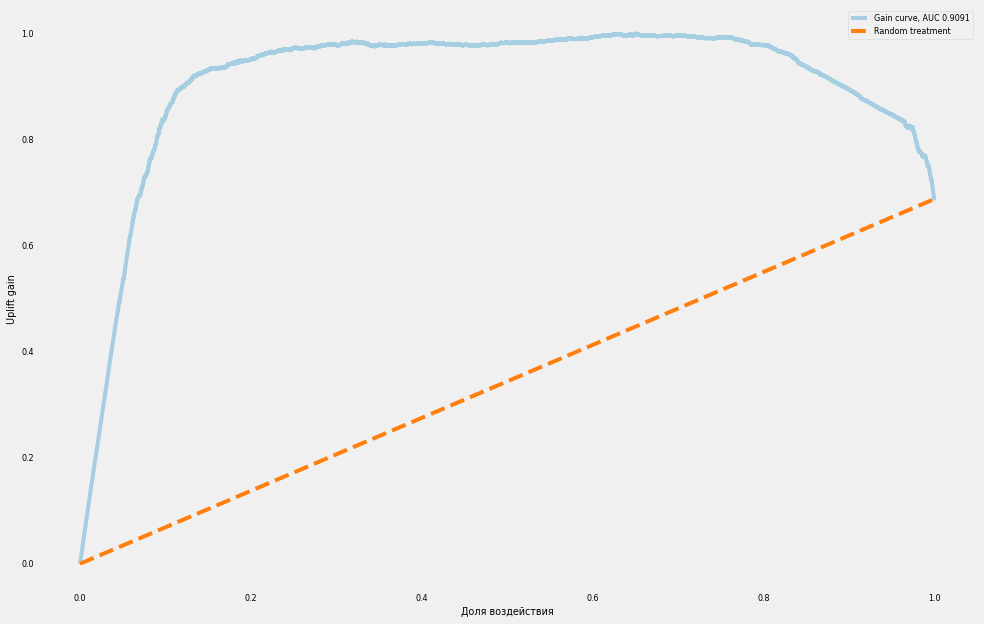

In [ ]:
#для RF-Learner
dataF = df3.copy()
dataF['Uplift score'] = Uplift_F
sorted_dataF = dataF.sort_values('Uplift score', ascending=False).reset_index(drop=True)

sorted_dataF['1_Test'] = (sorted_dataF['conversion'] * sorted_dataF['treatment']).cumsum()
sorted_dataF['1_Control'] = (sorted_dataF['conversion'] * (sorted_dataF['treatment']==0)).cumsum()
sorted_dataF['0_Test'] = sorted_dataF['treatment'].cumsum()
sorted_dataF['0_Control'] = (sorted_dataF['treatment']==0).cumsum()
sorted_dataF[['treatment', 'conversion', 'Uplift score', '1_Test', '1_Control', '0_Test', '0_Control']].head(10)

sorted_dataF['Gain curve'] = ((sorted_dataF['1_Test']/sorted_dataF['0_Test'])-(sorted_dataF['1_Control']/sorted_dataF['0_Control'])) * (sorted_dataF['0_Test'] + sorted_dataF['0_Control'])
gain_xF = sorted_dataF.index.values + 1
gain_xF = gain_xF/gain_xF.max()
gain_yF = (sorted_dataF['Gain curve']/sorted_dataF['Gain curve'].max()).values
nan_mask = np.isnan(gain_yF)
gain_xF = gain_xF[~nan_mask]
gain_yF = gain_yF[~nan_mask]

matplotlib.rcParams['font.size'] = 8
gain_auc = auc(gain_xF, gain_yF)
plt.figure(figsize=(15, 10))
ax = plt.axes()
ax.plot(gain_xF, gain_yF, label='Gain curve, AUC {}'.format(gain_auc.round(4)))
ax.plot([0, 1], [0, gain_yF[-1]],'--', color='tab:orange',label='Random treatment')
ax.legend()
ax.set_xlabel('Доля воздействия')
ax.set_ylabel('Uplift gain')
ax.grid()

In [ ]:
#для дальнейших действий выберем S-Leaner
#дадим рекомендации к воздействию
res_S['Rec'] = np.zeros(res_S.shape[0])
res_S.loc[res_S['CATE'] > 0, 'Rec'] = 1
res_S

,treatment,X_1,X_2,X_3,X_4,X_5,X_6,X_7,X_8,X_9,X_10,X_11,X_12,X_13,X_14,X_15,X_16,X_17,X_18,X_19,X_20,X_21,X_22,conversion,CATE,Rec
0,0,0.034351,0.550725,-1.348524,-0.029591,0.499535,-0.412464,0.933588,-0.522954,-0.029591,-0.807218,1.318646,-0.065262,-0.956947,-0.314573,-0.879456,0.640264,1.165722,0.570495,0.529443,0.227962,1.929914,0.798664,0,0.004064,1.0
1,0,-1.059404,0.299404,0.220273,-1.569660,1.084204,-2.167118,1.216469,-0.744547,-1.569660,-0.460971,-1.396720,0.600044,1.000000,0.303664,1.080643,2.646483,-0.329690,1.725636,1.434649,-2.064893,0.188000,-1.134651,0,0.005390,1.0
2,0,0.051934,2.338729,-0.341017,-1.099362,0.693090,-2.424267,1.572066,-0.212798,-1.099362,-1.430502,0.469694,1.251940,0.943003,-0.083721,-1.981712,0.224777,2.038004,2.516398,2.324280,-3.182196,-0.888490,-1.402561,0,0.004191,1.0
3,1,0.667770,0.539316,0.468719,-0.840885,-0.708331,0.126634,1.275854,-0.954919,-0.840885,0.408691,-0.422736,-1.593407,0.247038,-0.752011,-0.347319,-1.659402,-0.871980,-0.893513,-0.658078,-2.704997,-0.390745,-1.578004,1,0.983876,1.0
4,0,-1.416158,2.486628,0.496402,-1.174618,2.738267,-4.756755,-0.180918,-1.281432,-1.174618,-0.243256,0.598662,0.750706,0.554053,-1.198151,-0.232961,0.948875,1.210523,1.536723,1.548610,-0.926435,0.972459,-0.711251,0,-0.003542,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199995,0,-1.309691,2.925832,-0.584101,-1.232931,2.601140,-4.943288,0.416758,-0.083626,-1.232931,-0.156886,-0.009209,1.938339,0.374788,1.041399,0.975982,0.636279,1.073711,-0.406603,0.027760,-0.478887,1.265746,0.059865,0,0.008071,1.0
199996,0,-1.131361,1.562317,1.265630,-1.361879,1.169695,-3.247293,1.253718,-1.968727,-1.361879,1.487681,1.341897,-0.042151,0.695421,-0.485884,0.674360,0.892121,0.893261,0.182528,0.338611,1.006028,-1.943045,-0.145377,0,-0.015502,0.0
199997,0,0.442433,2.202153,-0.380019,-0.474935,0.766306,-1.722354,0.751083,0.595800,-0.474935,-1.133214,0.474008,-2.370446,-0.496472,1.098074,0.299918,0.718669,1.031289,0.398560,0.591750,1.620529,-1.081292,0.995816,0,-0.004010,0.0
199998,1,-0.084879,0.423688,0.389931,-1.996510,-0.123098,-1.103408,2.207197,0.402468,-1.996510,-0.251343,-1.136188,0.842605,-0.296565,-0.511203,-0.150816,-0.256026,2.231563,0.848577,0.739235,1.656343,0.436962,0.622010,0,-0.004295,0.0


In [ ]:
#вычислим ожидаемую конверсию
#то есть это те, кто конверсировался без воздействия, плюс те, которых мы можем заманить грамотной рекомендацией
exp_conv = len(res_S[((res_S['conversion'] == 1) & (res_S['treatment'] == 0)) | (res_S['Rec'] == 1)]) / len(res_S)
exp_conv

0.699405

In [ ]:
#эксперимент можно считать рандоминизированным
#ATE значимый
#сравнивая с первоначальным уровнем конверсии, можем сделать вывод, что, дав рекомендации к воздействию, мы можем ее увеличить